<Figure size 432x288 with 0 Axes>

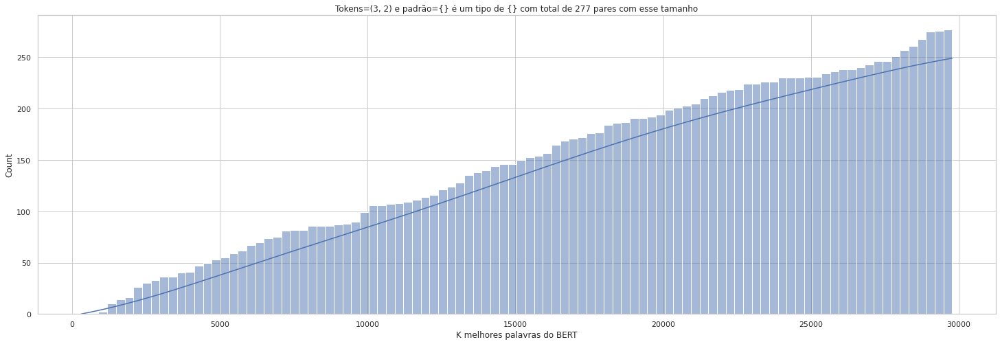

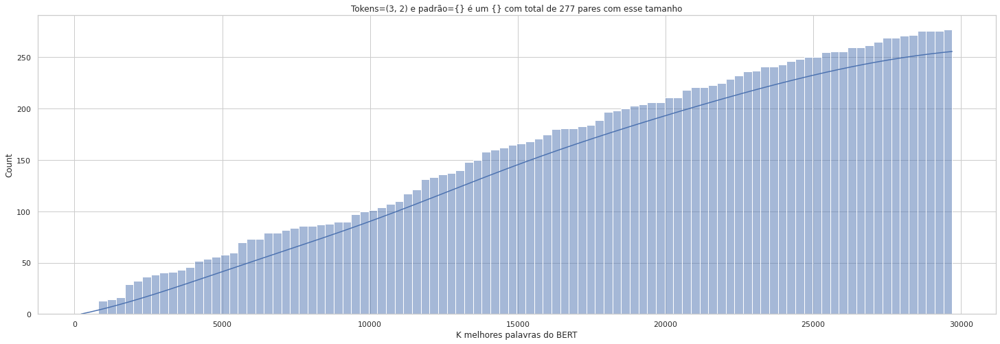

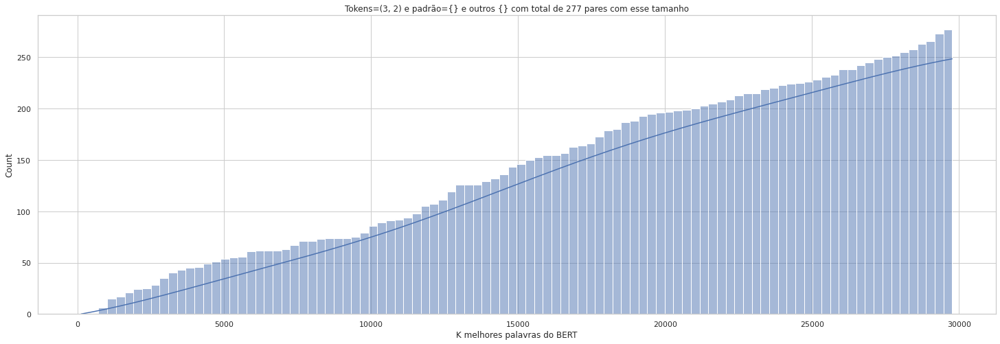

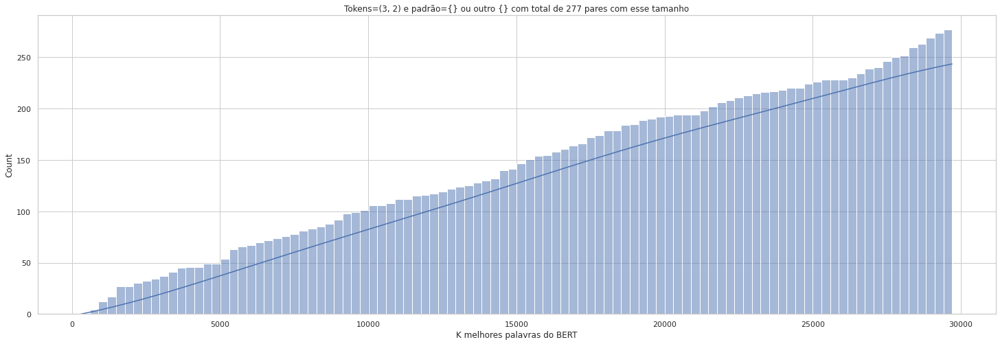

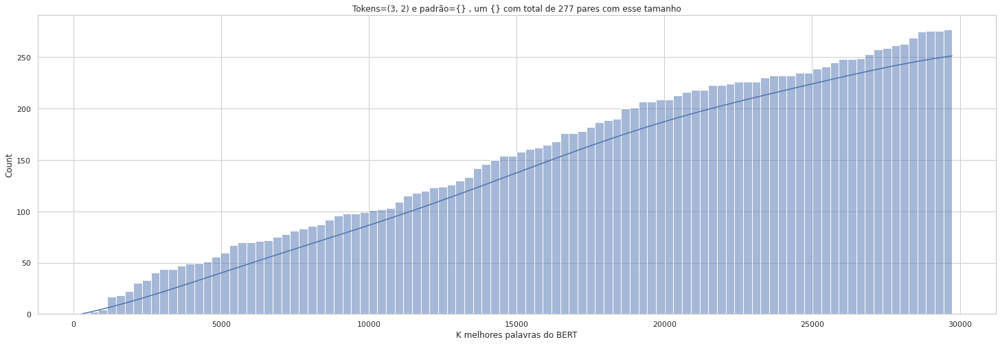

...

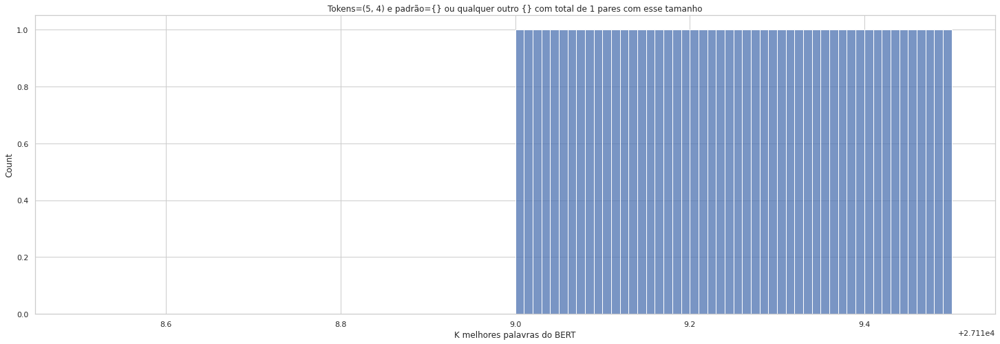

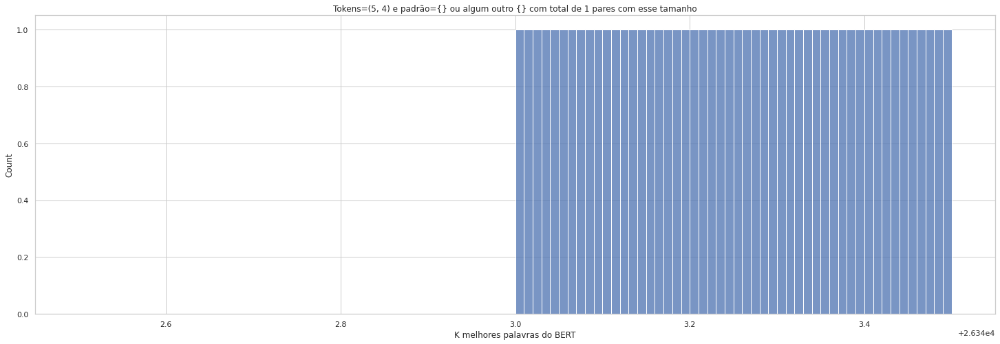

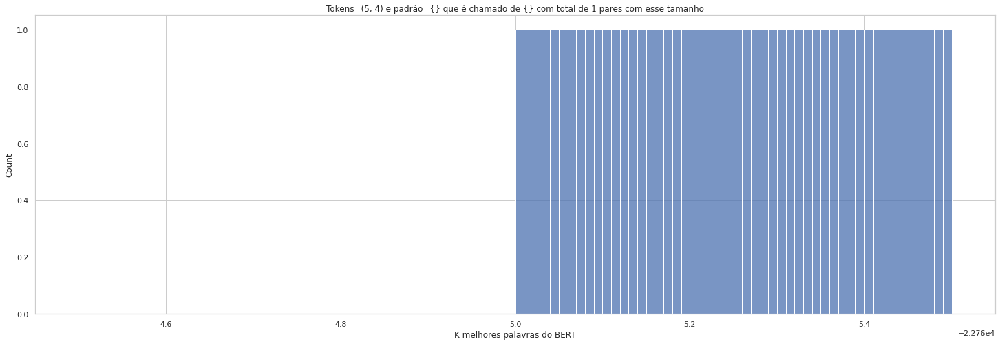

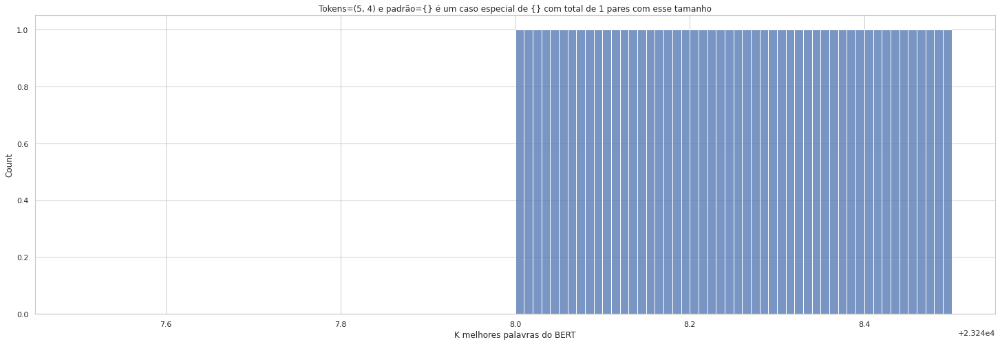

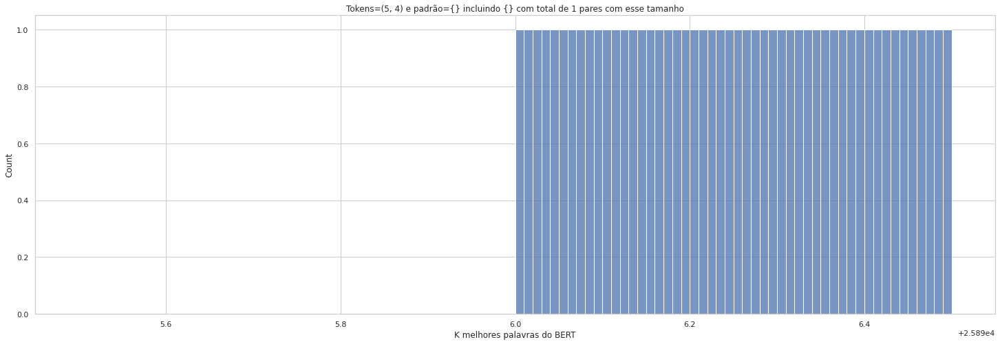

Done!


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os

sns.set(style="whitegrid")
plt.clf()

path = "../results/top_k/saida_topk.tsv"
df = pd.read_csv(path, delimiter="\t")
df = df.drop_duplicates(subset=['dataset', 'token_size', 'pattern', 'qtd', 'total'], keep="first")
# df['dataset_N'] = os.path.basename(df['dataset'])
dataset_uniques = df['dataset'].unique().tolist()

df1 = df[df['dataset'] == dataset_uniques[1]]
del df
df1 = df1.drop_duplicates(subset=['token_size', 'pattern', 'qtd', 'total'], keep="first")
pattern_unique = df1['pattern'].unique().tolist()
token_size_unique = df1['token_size'].unique().tolist()

for t_s in token_size_unique:
    for p in pattern_unique:
        plt.figure(figsize=(25,8))
        df_plot = df1[df1['pattern'] == p]
        df_plot = df_plot[df_plot['token_size'] == t_s]
        df_plot['qtd_diff'] = df_plot['qtd'].sub(df_plot['qtd'].shift())
        df_plot.fillna(df_plot.iloc[0]['qtd'], inplace=True)
        if df_plot.shape[0] != 1:
            ax = sns.histplot(x="K", weights="qtd_diff", bins=100, kde=True, cumulative=True, data=df_plot)
        else:
            ax = sns.histplot(x="K", weights="qtd_diff", bins=100, kde=False, cumulative=True, data=df_plot)

        total = df_plot['total'].unique().tolist()
        total2 = df_plot['qtd_diff'].sum()
        assert len(total) == 1
        assert total[0] == int(total2)
        ax.set(xlabel="K melhores palavras do BERT")
        ax.set_title(f"Tokens={t_s} e padrão={p} com total de {total[0]} pares com esse tamanho")
        plt.show()

print("Done!")